# Clustering Data Time Series Harga Bahan Pangan 

Data yang digunakan adalah data **Harian**, bertujuan untuk mengetahui perbedaan model pada data harian dan mingguan.

## Import Library

In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.dates as mdates
import seaborn as sns

from scipy.interpolate import interp1d
from dtaidistance import dtw
from dtaidistance import dtw_visualisation as dtwvis
from scipy.stats import pearsonr
from itertools import combinations

from sklearn.manifold import MDS

import skfuzzy as fuzz

## Load Data

In [2]:
data = pd.read_csv('Inti/Ori Harian.csv')
drop_columns = ['Beras', 'Bawang Merah', 'Bawang Putih', 'Cabai Merah', 'Cabai Rawit', 'Daging Sapi', 
                'Telur Ayam', 'Daging Ayam', 'Minyak Goreng', 'Gula Pasir']
data = data.drop(drop_columns, axis=1)
# Dataset asli tanpa imputasi dan interpolasi
data.head(5)

,Komoditas (Rp),Beras Kualitas Medium I,Bawang Merah Ukuran Sedang,Bawang Putih Ukuran Sedang,Cabai Merah Keriting,Cabai Rawit Merah,Daging Sapi Kualitas 1,Telur Ayam Ras Segar,Daging Ayam Ras Segar,Minyak Goreng Kemasan Bermerk 1,Gula Pasir Lokal
0,1/1/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2/1/2020,12150.0,39250.0,32250.0,67500.0,59100.0,121250.0,25900.0,37100.0,13450.0,13200.0
2,3/1/2020,12200.0,38900.0,31100.0,63000.0,60850.0,121250.0,25850.0,37100.0,13500.0,13200.0
3,6/1/2020,12250.0,36650.0,31250.0,64250.0,76150.0,121250.0,25650.0,35850.0,13500.0,13200.0
4,7/1/2020,12250.0,34600.0,31400.0,63600.0,64150.0,121250.0,25600.0,35900.0,13550.0,13350.0


## Exploratory Data
1. Mengganti nama kolom menjadi nama general
2. Mengubah tipe data fitur Komoditas (Rp) menjadi datetime
3. Mengecek nilai yang kosong
4. Mengecek nilai outlier
5. Visualisasi menggunakan diagram garis

### Mengganti nama kolom menjadi nama general

In [3]:
data = data.rename(columns={'Komoditas (Rp)':'Tanggal', 'Beras Kualitas Medium I': 'Beras', 'Bawang Merah Ukuran Sedang':'Bawang Merah',
                            'Bawang Putih Ukuran Sedang':'Bawang Putih', 'Cabai Merah Keriting': 'Cabai Merah', 'Cabai Rawit Merah':'Cabai Rawit', 
                            'Daging Sapi Kualitas 1':'Daging Sapi', 'Telur Ayam Ras Segar':'Telur Ayam', 'Daging Ayam Ras Segar':'Daging Ayam',
                           'Minyak Goreng Kemasan Bermerk 1':'Minyak Goreng', 'Gula Pasir Lokal':'Gula Pasir'})
data.head(5)

,Tanggal,Beras,Bawang Merah,Bawang Putih,Cabai Merah,Cabai Rawit,Daging Sapi,Telur Ayam,Daging Ayam,Minyak Goreng,Gula Pasir
0,1/1/2020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2/1/2020,12150.0,39250.0,32250.0,67500.0,59100.0,121250.0,25900.0,37100.0,13450.0,13200.0
2,3/1/2020,12200.0,38900.0,31100.0,63000.0,60850.0,121250.0,25850.0,37100.0,13500.0,13200.0
3,6/1/2020,12250.0,36650.0,31250.0,64250.0,76150.0,121250.0,25650.0,35850.0,13500.0,13200.0
4,7/1/2020,12250.0,34600.0,31400.0,63600.0,64150.0,121250.0,25600.0,35900.0,13550.0,13350.0


### Mengubah fitur Tanggal menjadi datetime

In [4]:
data['Tanggal'] = pd.to_datetime(data['Tanggal'], format="%d/%m/%Y")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1305 entries, 0 to 1304
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Tanggal        1305 non-null   datetime64[ns]
 1   Beras          1255 non-null   float64       
 2   Bawang Merah   1255 non-null   float64       
 3   Bawang Putih   1255 non-null   float64       
 4   Cabai Merah    1255 non-null   float64       
 5   Cabai Rawit    1255 non-null   float64       
 6   Daging Sapi    1255 non-null   float64       
 7   Telur Ayam     1255 non-null   float64       
 8   Daging Ayam    1255 non-null   float64       
 9   Minyak Goreng  1255 non-null   float64       
 10  Gula Pasir     1255 non-null   float64       
dtypes: datetime64[ns](1), float64(10)
memory usage: 112.3 KB


### Mengecek nilai yang kosong atau missing value

In [5]:
print('Jumlah Data yang kosong')
data.isnull().sum()

Jumlah Data yang kosong


Tanggal           0
Beras            50
Bawang Merah     50
Bawang Putih     50
Cabai Merah      50
Cabai Rawit      50
Daging Sapi      50
Telur Ayam       50
Daging Ayam      50
Minyak Goreng    50
Gula Pasir       50
dtype: int64

Pada masing-masing fitur memiliki banyak missing value. Terjadi karena pada akhir pekan dan hari libur nasional tidak dilakukan input nilai ke sistem, terutama data yang digunakan merupakan data harian. Rasio jumlah data dan nilai kosong adalah 
<div>
<div style="text-align: center;">
    <img src="https://latex.codecogs.com/png.image?\dpi{120} \frac{50}{1255} \times 100\% = 3.98\% \approx 4\%" alt="Ratio Missing Value">
</div>
</div>

Jumlah data yang kosong, ~4% dan data valid sebesar 95% di mana termasuk rendah dan masih dapat diatasi menggunakan teknik imputasi. Pada penelitian ini, data akan ditransformasi menjadi bentuk mingguan, setelahnya data yang kosong akan diisi mennggunakan metode backward fill. Pada visualisasi _time-series_ di atas, pola juga masih terlihat dengan banyak fluktuasi.

In [6]:
data.describe().round(2)

,Tanggal,Beras,Bawang Merah,Bawang Putih,Cabai Merah,Cabai Rawit,Daging Sapi,Telur Ayam,Daging Ayam,Minyak Goreng,Gula Pasir
count,1305,1255.00,1255.00,1255.00,1255.00,1255.00,1255.00,1255.00,1255.00,1255.00,1255.00
mean,2022-07-01 19:12:00,12963.78,36366.02,32917.45,45491.16,55206.77,135114.86,26270.80,37447.85,17923.63,15163.35
min,2020-01-01 00:00:00,11400.00,21400.00,20250.00,20350.00,22500.00,121250.00,18350.00,31100.00,13200.00,12950.00
25%,2021-04-01 00:00:00,11700.00,30250.00,26500.00,32400.00,38300.00,132500.00,24250.00,35900.00,15400.00,13700.00
50%,2022-07-01 00:00:00,12400.00,34400.00,29850.00,42100.00,49000.00,137500.00,26350.00,37250.00,18500.00,14700.00
75%,2023-10-02 00:00:00,14500.00,41125.00,40150.00,54500.00,69200.00,141650.00,28150.00,38750.00,19400.00,17100.00
max,2024-12-31 00:00:00,16850.00,73600.00,59000.00,126400.00,134500.00,165850.00,32600.00,46100.00,24750.00,18900.00
std,NaN,1409.43,9214.59,7451.49,17996.34,23510.57,7907.35,3101.36,2355.44,2786.25,1764.87


Insight:
1. **Beras : Beras Kualitas Medium**, rata-rata harga beras adalah Rp12.963 atau sekitar Rp13.000. Persebaran harganya dimulai dari Rp11.400 hingga Rp16.850, tidak menunjukkan selisih dan persebaran yang terlalu besar.
2. **Bawang Merah : Bawang Merah Ukuran Sedang**, rata-rata harga bawang merah per-kilogram mencapai Rp36.366. Persebaran harganya dimulai dari Rp21.400 hingga Rp73.600. Rentang harga menunjukkan nilai yang tinggi dan terdapat variasi harga yang cukup tinggi.
3. **Bawang Putih : Bawang Putih Ukuran Sedang**, rata-rata harga bawahng putih per-kilogram mencapai Rp32.917 atau sekitar Rp33.000. Persebaran harga dimulai dari Rp20.250 hingga Rp59.000 dengan persebaran sedang yang tidak terlalu tinggi.
4. **Cabai Merah : Cabai Merah Keriting**, rata-rata harga cabai merah per-kilogram mencapai harga Rp45.491. Persebaran harga dimulai dari Rp20.350 hingga Rp126.400 dengan nilai standar deviasi sebesar 17.996 menunjukkan persebaran harga lebih tinggi dan mengindikasikan bahwa komoditas ini memiliki harga yang fluktuatif.
5. **Cabai Rawit : Cabai Rawit Merah**, rata-rata harga cabai rawit merah menunjukkan harga Rp55.206. Persebaran harga dimulai dari RpRp22500 hingga Rp134500, jarak kedua harga mencapai Rp112.00 dan standar deviasi mencapai Rp23.510. Termasuk persebarannya tinggi dan dikhawatirkan harga sangat fluktuatif.
6. **Daging Sapi : Daging Sapi Kualitas 1**, rata-rata harga daging sapi mencapai Rp135.114. Persebaran harga dimulai dari Rp121.250 hingga Rp165.850. Meskipun harga daging sapi termasuk tinggi, tetapi persebarannya tidak terlalu tinggi dengan standar deviasi mencapai 7.907. Nilai rata-rata lebih denat dengan Q1 di mana harga cenderung rendah.
7. **Telur Ayam : Telur Ayam Ras Segar**, rata-rata harga telur ayam mencapai Rp26.270 dengan persebaran mulai Rp18.350 hingga Rp32.600. Nilai rata-rata lebih dekat dengan nilai Q3, artinya data menyebar di atas nilai rata-rata.
8. **Daging Ayam : Daging Ayam Ras Segar**, rata-rata harga daging ayam per-kilogram mencapai Rp37.477 dengan persebaran mulai Rp31.100 hingga Rp46.100. (belum paham nih sama daging ayam gimana.
9. **Minyak Goreng : Minyak Goreng Kemasan Bermerk 1**, harga rata-rata minyak goreng bermerk Rp17.923 atau sekitar Rp18.000 dengan rentang mulai Rp13.200 hingga Rp24.750. Dilihat dari nilai Q3, Q2, dan Q1 menunjukkan bahwa harga minyak goreng bermerk tersebar ke atas.
10. **Gula Pasir : Gula Pasir Lokal**, rata-rata harga bahan pangan mencapai Rp15.163 per-kilogramnya. Rentang harga mulai dari Rp12.950 hingga Rp18.900 dan simpangan baku 1.764 menunjukkan bahwa sebaran harga Gula Pasir Lokal cenderung stabil  dan merata ke atas.

### Mengecek nilai outlier
Pengecekan ini digunakan teknik visualisai boxplot

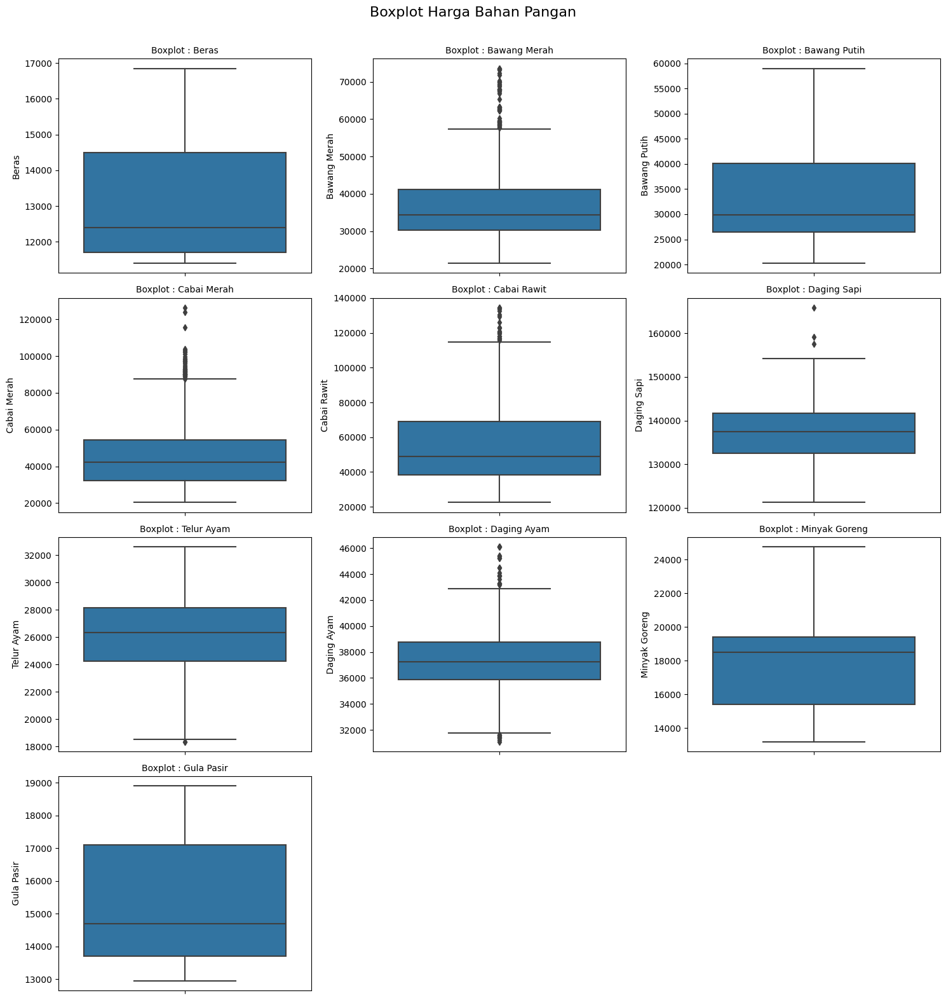

In [7]:
data_vis = data.drop(['Tanggal'], axis=1).copy() # Variabel ini khusus untuk visualisasi, supaya variabel tanggal tidak terbawa divisualisasikan.

# Visualisasi Boxplot Harga Bahan Pangan
n = len(data_vis.columns)

# Ukuran grid
cols = 3
rows = math.ceil(n/cols)

# Buat plot
fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
axes = axes.flatten()

for i, col in enumerate(data_vis.columns):
    sns.boxplot(y=data_vis[col], ax=axes[i])
    axes[i].set_title(f'Boxplot : {col}', fontsize=10)

# Hapus subplot yang kosong
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Sisakan ruang untuk suptitle
plt.suptitle('Boxplot Harga Bahan Pangan', fontsize=16)
plt.show()

insight:
1. Hampir semua fitur memiliki sebaran data mayoritas di atas nilai rata-rata. Kecuali pada fitur Minyak Goreng Bermerk 1, sebaran harganya di bawah nilai rata-rata dan Daging Sapi meskipun memiliki beberapa nilai outlier ke atas.
2. Terdapat beberapa fitur yang memiliki outlier di atas, yaitu Bawang Merah, Cabai Merah, Cabai Rawit, dan Daging Sapi, Telur Ayam dengan sedikit outlier di bawah, dan Daging Ayam dengan outlier di atas dan di bawah.

In [8]:
### Visualisasi Diagram Garis 

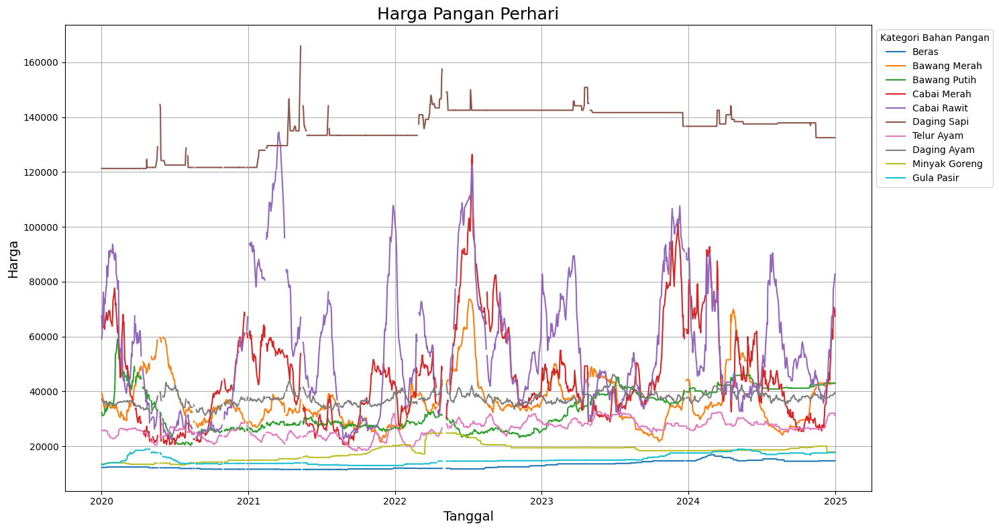

In [9]:
def diagramGarisVis(df, datetime_col, label_name=None, title="Diagram Garis Harga Bahan Pangan"):
    """
    Visualisasi Diagram Garis Harga Bahan Pangan.
    
    Parameters:
    - df: DataFrame berisi data harga
    - datetime_col: nama kolom untuk sumbu x (string)
    - label_name: label untuk legend, default-nya adalah nama-nama kolom selain datetime_col
    - title: judul grafik
    """
    figure(figsize=(15, 8), dpi=100)

    data_vis = df.drop(columns=[datetime_col])
    if label_name is None:
        label_name = drop_columns

    for col, label in zip(data_vis.columns, label_name):
        plt.plot(df[datetime_col], df[col], label=label)

    plt.legend(title='Kategori Bahan Pangan', loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(title, fontsize=18)
    plt.xlabel(datetime_col, fontsize=14)
    plt.ylabel('Harga', fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

diagramGarisVis(data, datetime_col='Tanggal', title='Harga Pangan Perhari')

Insight.
1. Data yang kosong mempengaruhi pola pada data.
2. Data Cabai Rawit, Cabai Merah, dan Bawang Merah dengan pola fluktuatif ekstrim.
3. Harga Daging Sapi memiliki harga yang peling tinggi dan cenderung stabil.
4. Pola fluktuasi harga bahan pangan di akhir tahun dan awal tahun cenderung meningkat dan tidak stabil.
5. Fluktuasi harga yang paling tinggi terjadi pada awal tahun 2021 dan pertengahan tahun 2022.

## Data Preparation
Langkah-langkah yang dilakukan:
1. Menambahkan fitur tahun
2. Transformasi data ke bentuk mingguan
3. Normalisasi Data
4. Transpose Data
5. Modeling Dynamic Time Warping (DTW)
6. Reduksi Data menggunakan Multidimensional Scaling (MDS)

### Menambah Fitur Tahun
Dilakukan agar lebih mudah menganalisis data

In [ ]:
# Menambahkan fitur tahun
data['Tahun'] = data['Tanggal'].dt.year
data.head()

### Transformasi Data
Perubahan bentuk data dari data harian menjadi data mingguan

In [ ]:
# Mengurutkan data berdasarkan tanggal
data_mingguan = data.sort_values(by='Tanggal').reset_index(drop=True)

# Membuat kolom minggu dan dimulai dari minggu pertama
data_mingguan['Minggu ke'] = None
# Memulai index minggu ke 1 dimulai dari tanggal 1 Januari 2020 hingga 3 Januari 2020
data.loc[data['Tanggal'].between("2020-01-01", "2020-01-03"), "Minggu ke"] = 1

# Filter hari kerja, karena pada akhir pekan tidak dilakukan penginputan data dan dimulai pada tanggal 6 Januari 2020
data_sisa['Minggu ke'] = ((data_sisa['Tanggal'] - pd.Timestamp("2020-01-06")).dt.days // 7) + 2

# Gabungkan data berdasarkan minggunya ke dalam data_mingguan
data_mingguan.uptdae(data_sisa)

data_mingguan["Minggu ke"] = data_mingguan["Minggu ke"].astype("Int64")

# Menghitung rata-rata perminggu dan mengabaikan Nan
data_mingguan = data_mingguan.groupby("Minggu ke").agg(lambda x: x[x > 0].mean(skipna=True)).reset_index()

data_mingguan

In [ ]:
data_mingguan.isnull()

In [ ]:
Terdapat satu minggu kosong, artinya terdapat satu minggu penuh hari libur dan tidak ada pelaporan monitoring harga pangan. Harga yang kosong berada di minggu ke 123 dan pengisian data yang kosong akan diisi menggunakan nilai pada minggu sebelumnya (backward fill).

In [ ]:
# Visualisasi Harga Bahan Pangan yang Sudah Ditransformasi ke bentuk mingguan
diagramGarisVis(data_mingguan, datetime_col='Minggu ke', title='Harga Pangan Mingguan')

### Normalisasi Data

Normalisasi data dilakukan untuk mentransformasi data asli menjadi rentang 0 sampai 1, sehingga data sebelum dan sesudah dinormalisasi memiliki perbandingan yang seimbang. Hasilnya, antar variabel memiliki skala yang sama dengan rumus:

<div>
<div style="text-align: center;">
    <img src="https://latex.codecogs.com/png.image?\dpi{120}&space;\text{Min-Max}=\frac{X-X[min]}{X[max]-X[min]}" alt="Ratio Missing Value">
</div>
</div>

Dimana $X merupakan data yang akan dinormalisasi

In [12]:
def standarization(df, col=drop_columns):
    """ Fungsi untuk standarisasi data pada masing-masing harga pangan
    Parameter:
    df : DataFrame yang berisi harga pangan
    col : kolom yang akan distandarisasi (list)
    """
    data_scaled = df.copy()
    data_scaled[col] = (df[col] - df[col].min(axis=0)) / (df[col].max(axis=0) - df[col].min(axis=0))
    return data_scaled

data_scaled = standarization(data_harian)
data_scaled

,Tanggal,Beras,Bawang Merah,Bawang Putih,Cabai Merah,Cabai Rawit,Daging Sapi,Telur Ayam,Daging Ayam,Minyak Goreng,Gula Pasir
0,2020-01-01,0.137615,0.341954,0.309677,0.444602,0.326786,0.000000,0.529825,0.400000,0.021645,0.042017
1,2020-01-02,0.137615,0.341954,0.309677,0.444602,0.326786,0.000000,0.529825,0.400000,0.021645,0.042017
2,2020-01-03,0.146789,0.335249,0.280000,0.402169,0.342411,0.000000,0.526316,0.400000,0.025974,0.042017
3,2020-01-06,0.155963,0.292146,0.283871,0.413956,0.479018,0.000000,0.512281,0.316667,0.025974,0.042017
4,2020-01-07,0.155963,0.252874,0.287742,0.407826,0.371875,0.000000,0.508772,0.320000,0.030303,0.067227
...,...,...,...,...,...,...,...,...,...,...,...
1300,2024-12-25,0.596330,0.410920,0.587097,0.365394,0.403125,0.252242,0.957895,0.493333,0.406926,0.789916
1301,2024-12-26,0.596330,0.410920,0.587097,0.365394,0.403125,0.252242,0.957895,0.493333,0.406926,0.789916
1302,2024-12-27,0.596330,0.410920,0.587097,0.476662,0.487946,0.252242,0.957895,0.526667,0.406926,0.789916
1303,2024-12-30,0.596330,0.410920,0.587097,0.469118,0.520982,0.252242,0.957895,0.526667,0.406926,0.789916


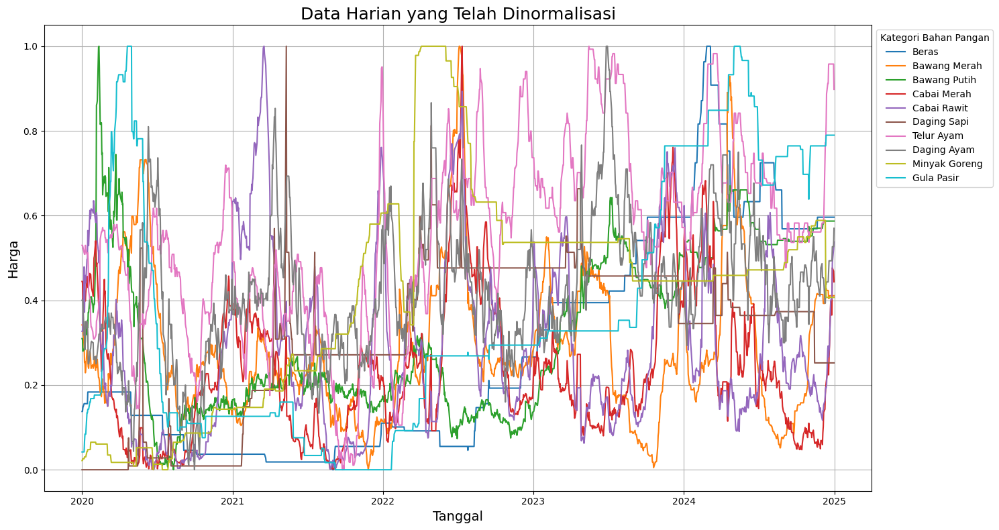

In [13]:
diagramGarisVis(data_scaled, datetime_col='Tanggal', title='Data Harian yang Telah Dinormalisasi')

Data pada masing-masing kolom berada di rentang 0 hingga 1 dan bergerak sesuai polanya seperti sebelumnya.

### Transpose Data

### Modeling Dynamic Time Warping (DTW)
Dengan rumus:
<div>
<div align="center">
    <img src="https://latex.codecogs.com/png.image?\dpi{150}&space;D_{i,j}=L_{i,j}+\min\left\{D_{i-1,j},D_{i,j-1},D_{i-1,j-1}\right\}" alt="Normalisasi Data">
</div>
</div>

#### Kombinasi DTW antar variabel

C:\Users\ASUS\AppData\Local\Temp\ipykernel_13696\2687600318.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12,6))
D:\MATKUL\SMT7\Skripsi\Program Kodingan dan Dataset\skripsi\Lib\site-packages\IPython\core\events.py:82: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


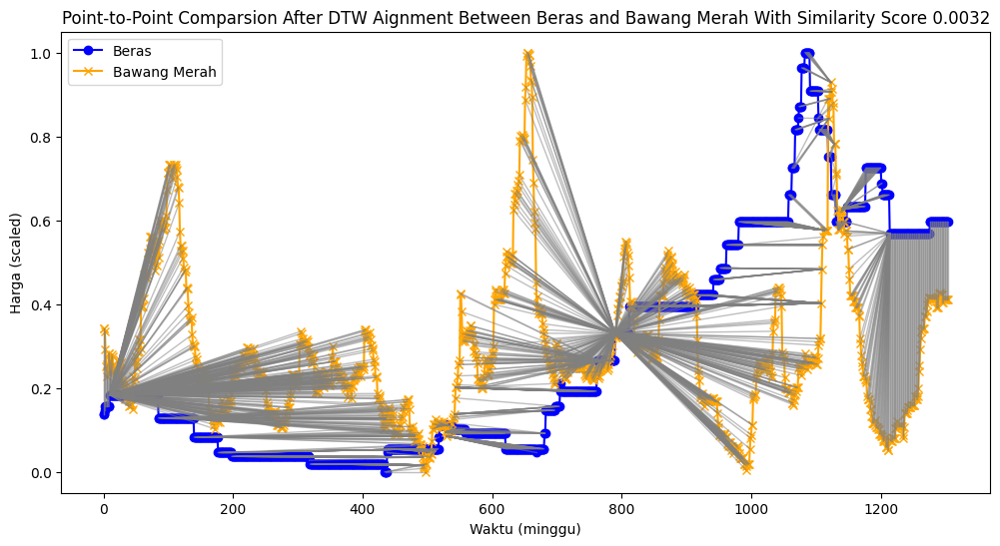

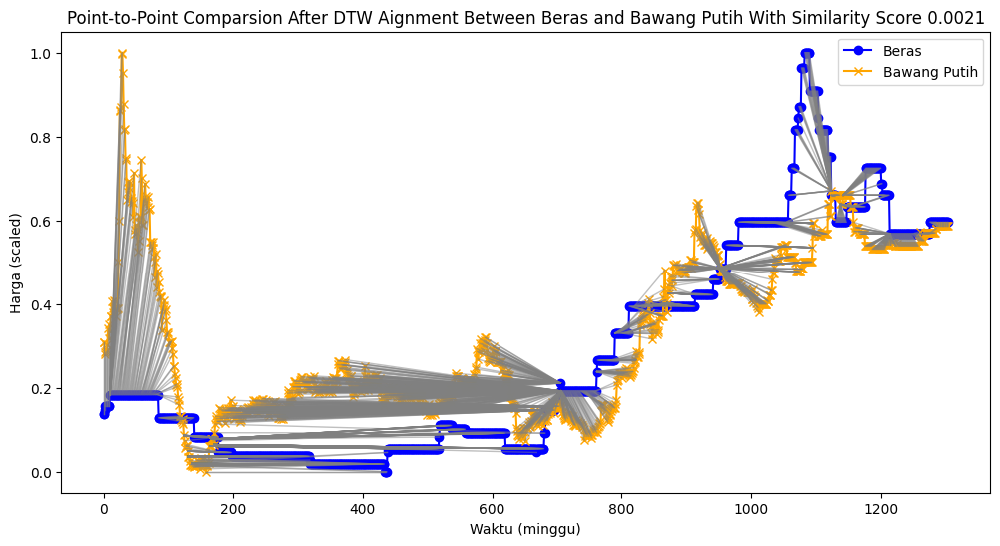

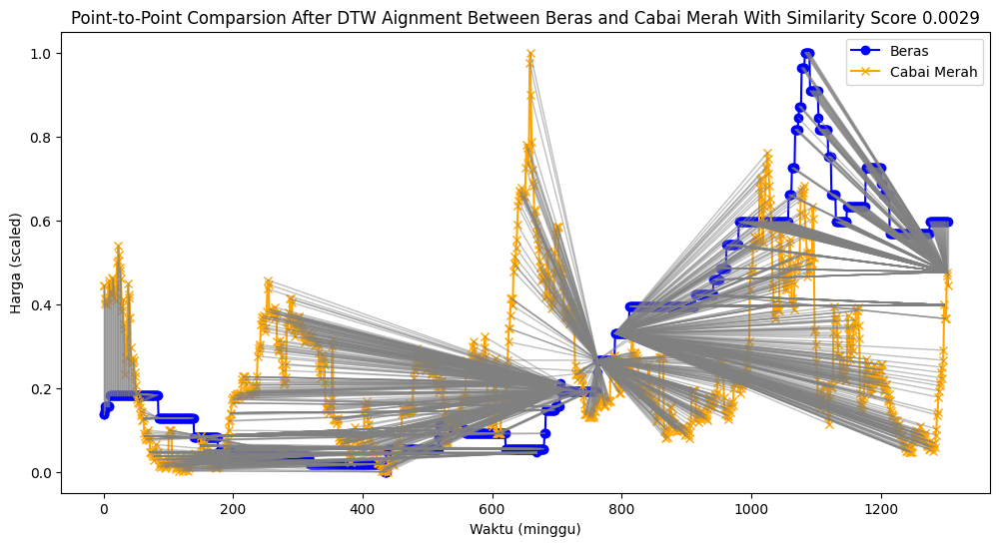

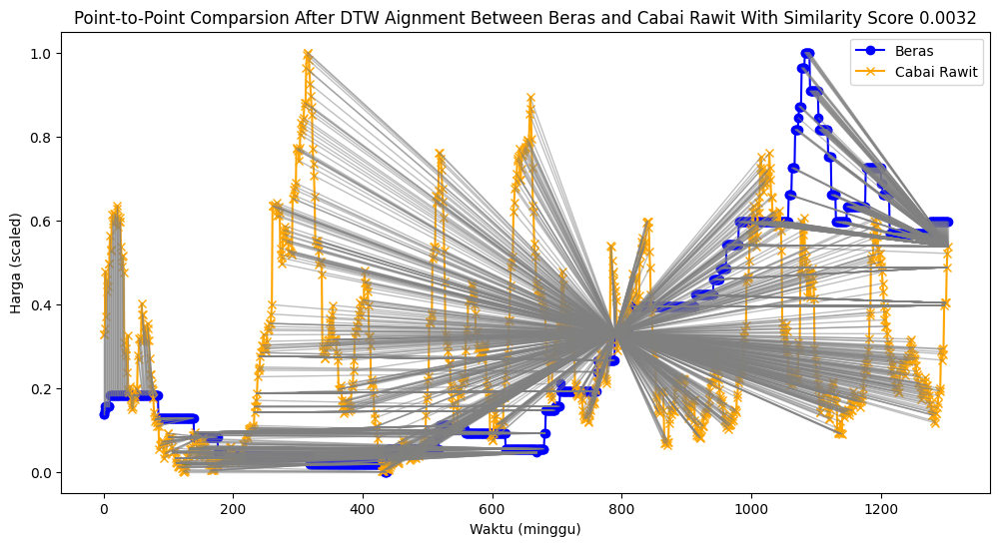

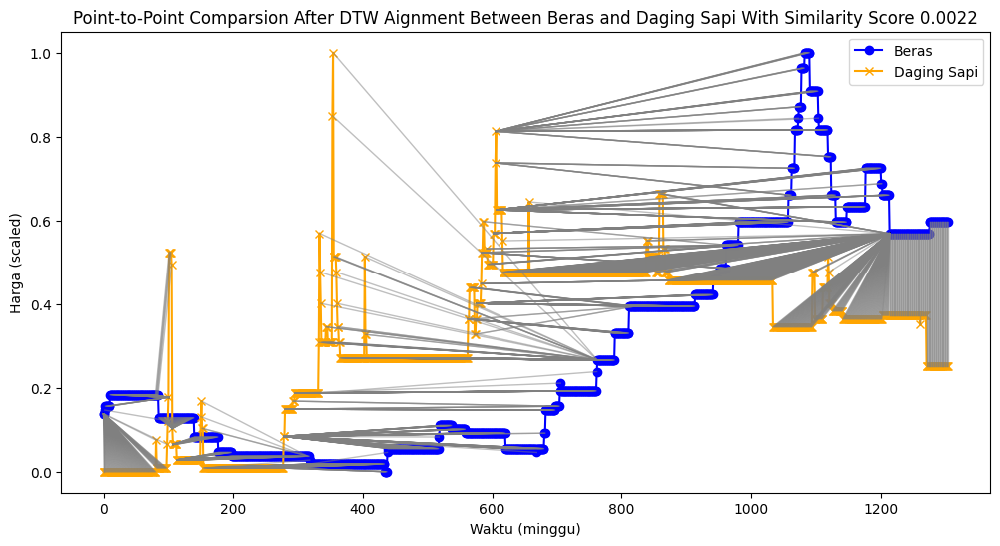

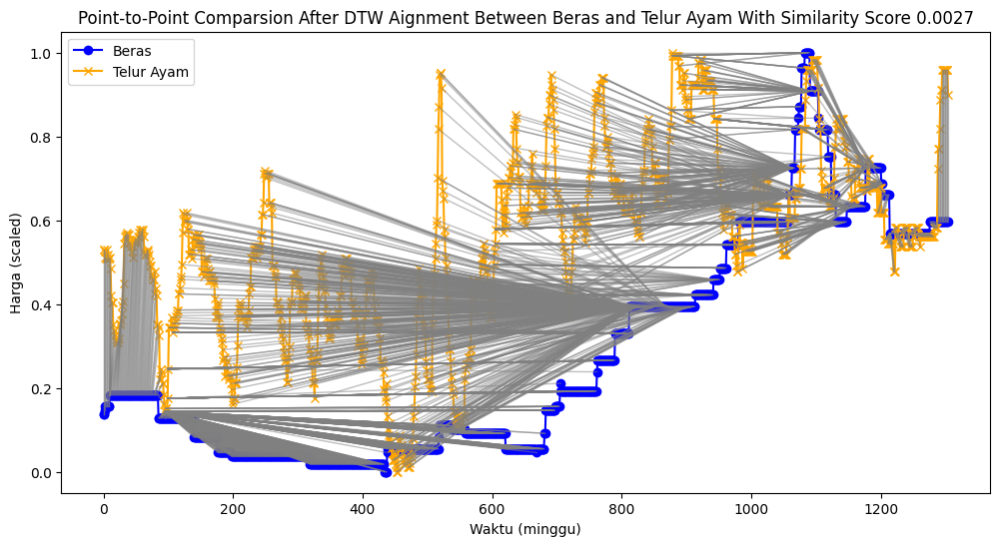

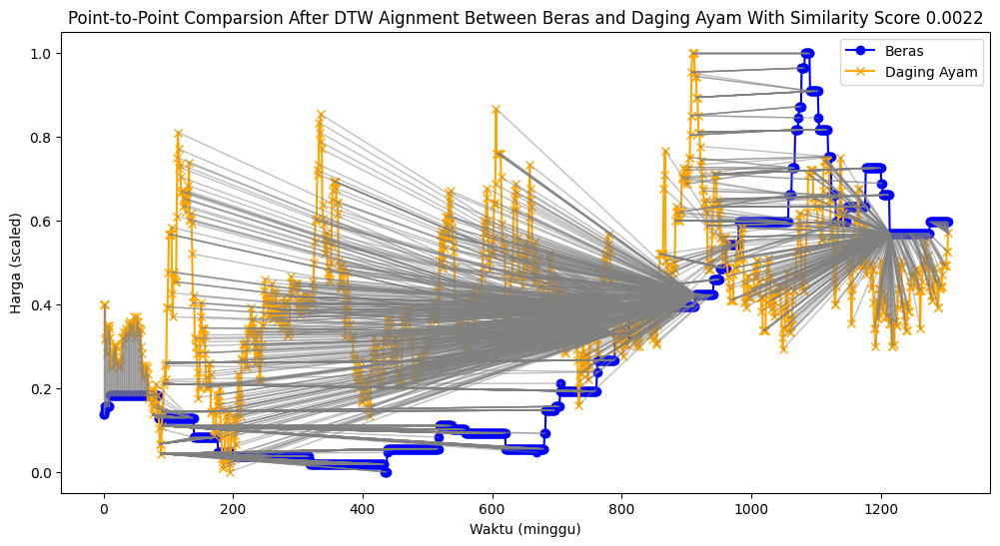

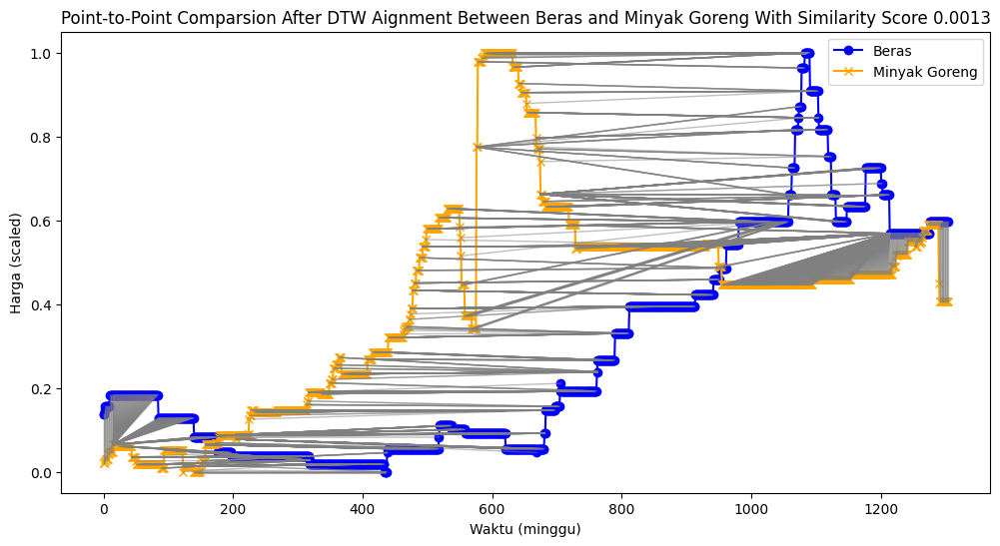

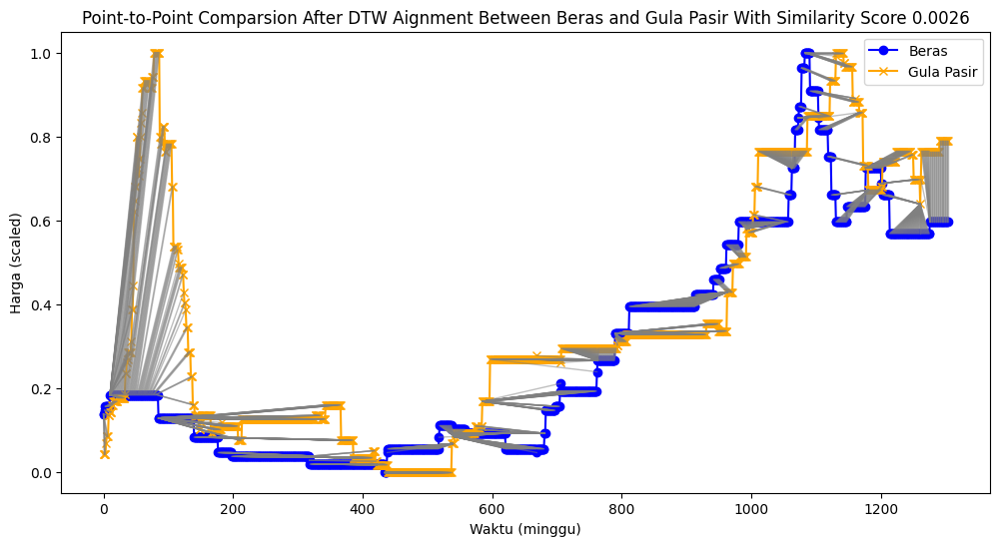

D:\MATKUL\SMT7\Skripsi\Program Kodingan dan Dataset\skripsi\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


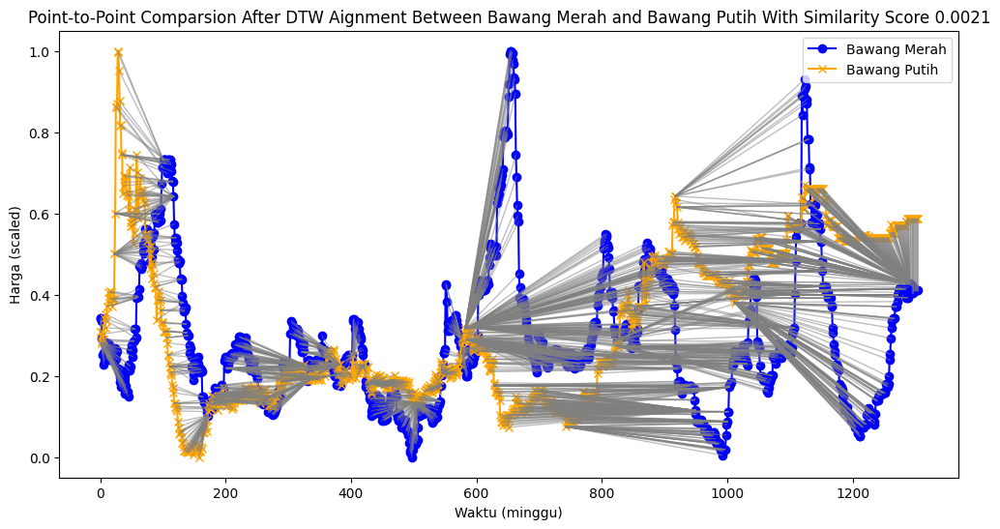

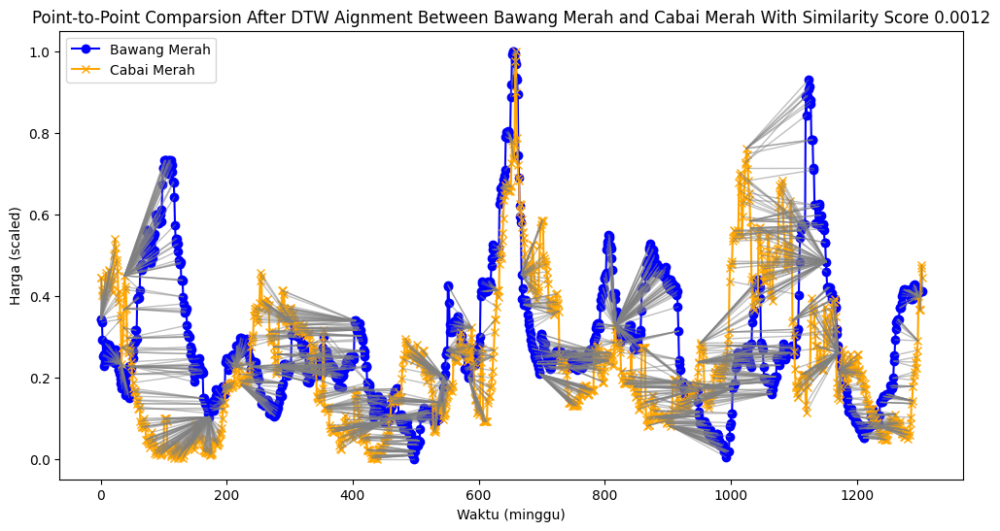

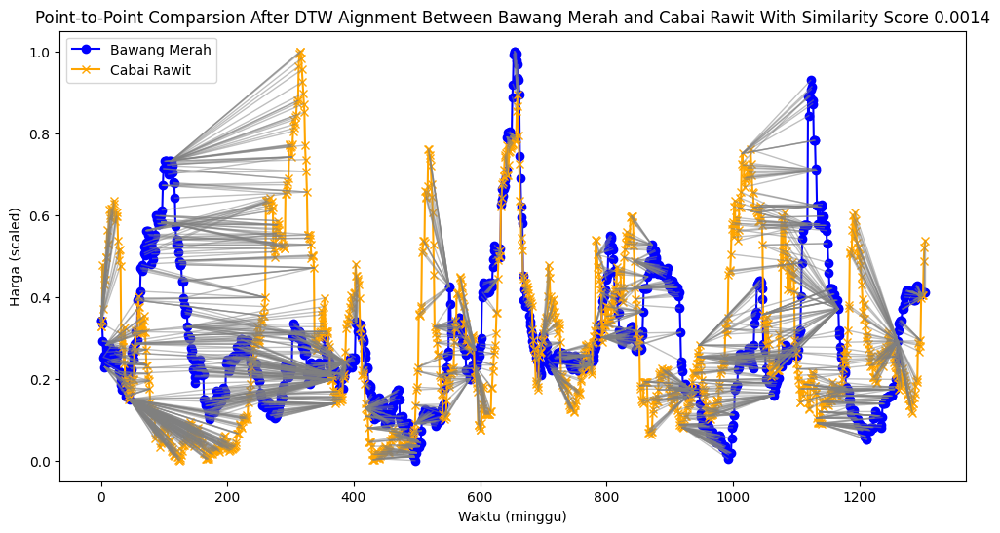

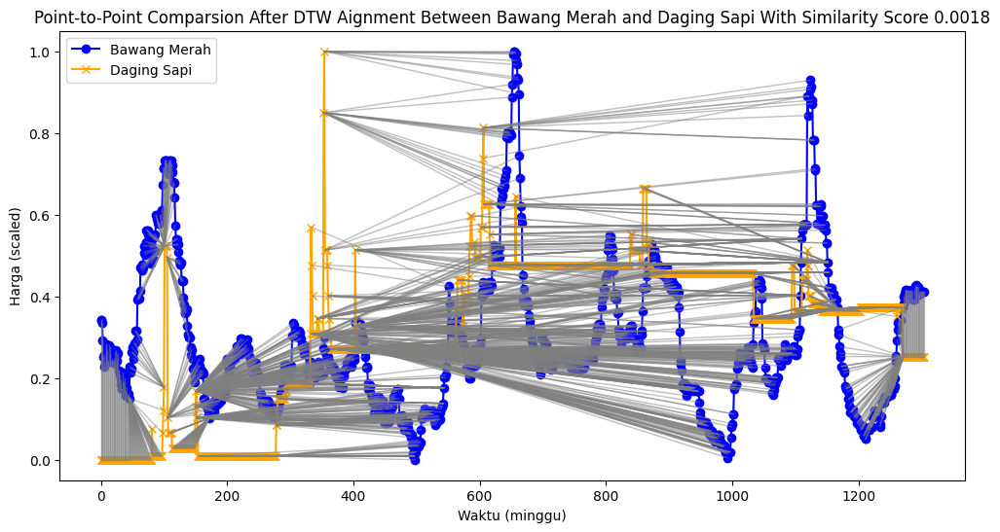

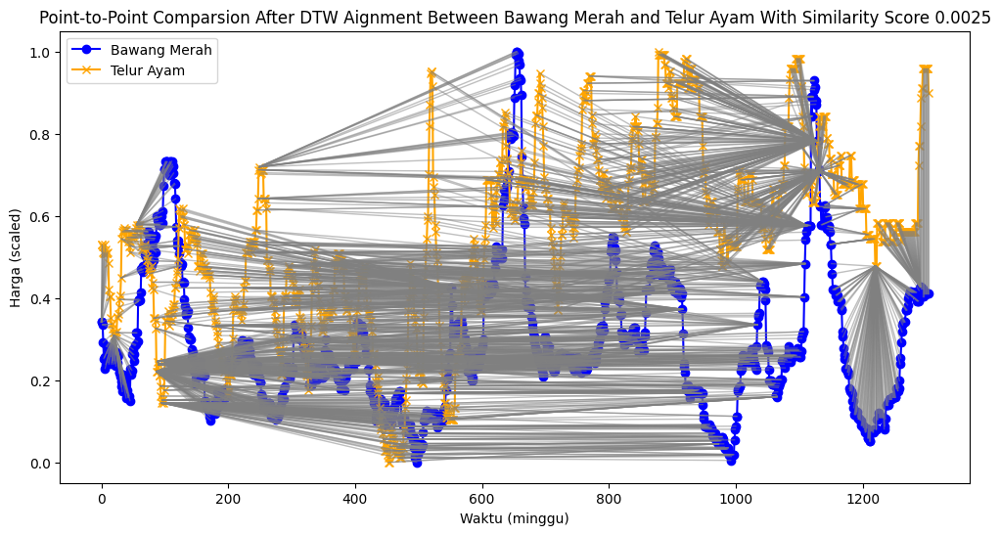

...

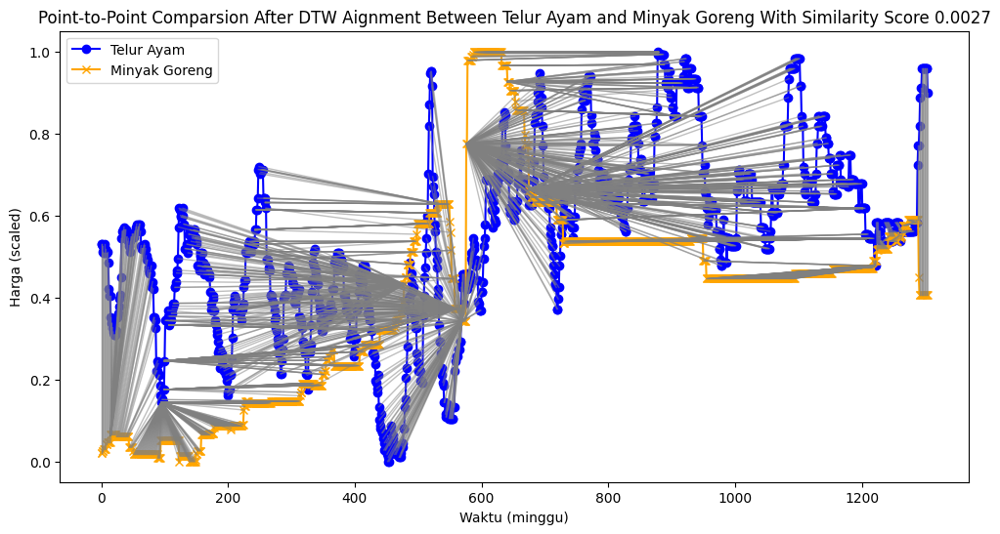

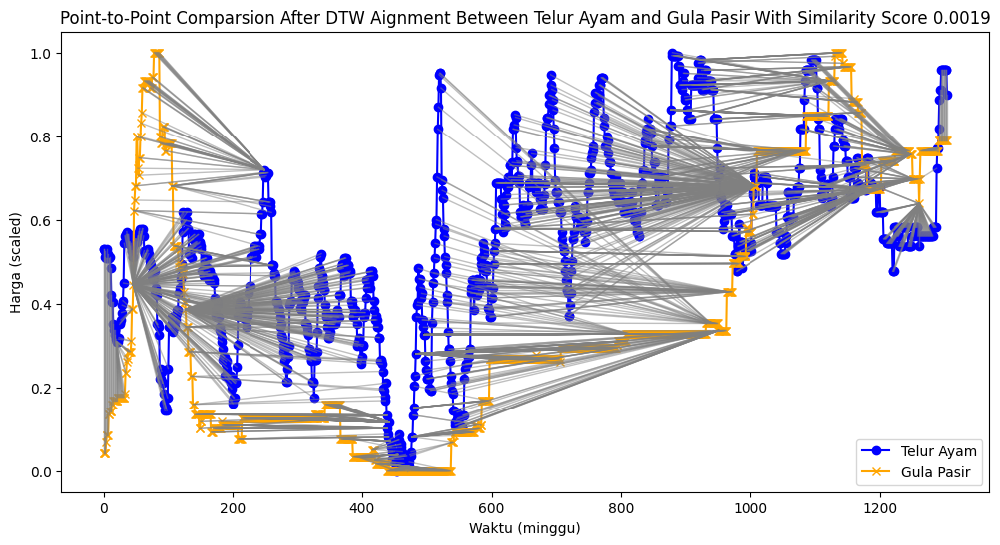

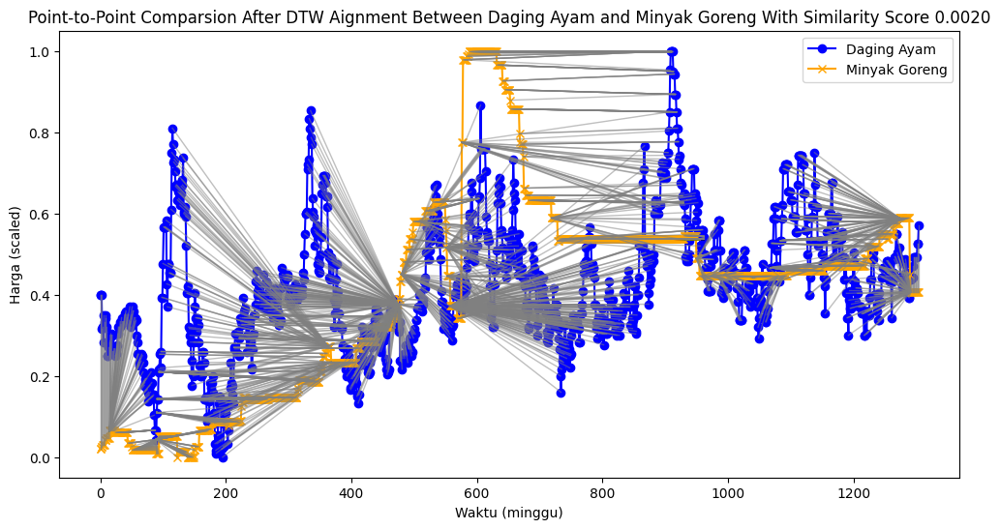

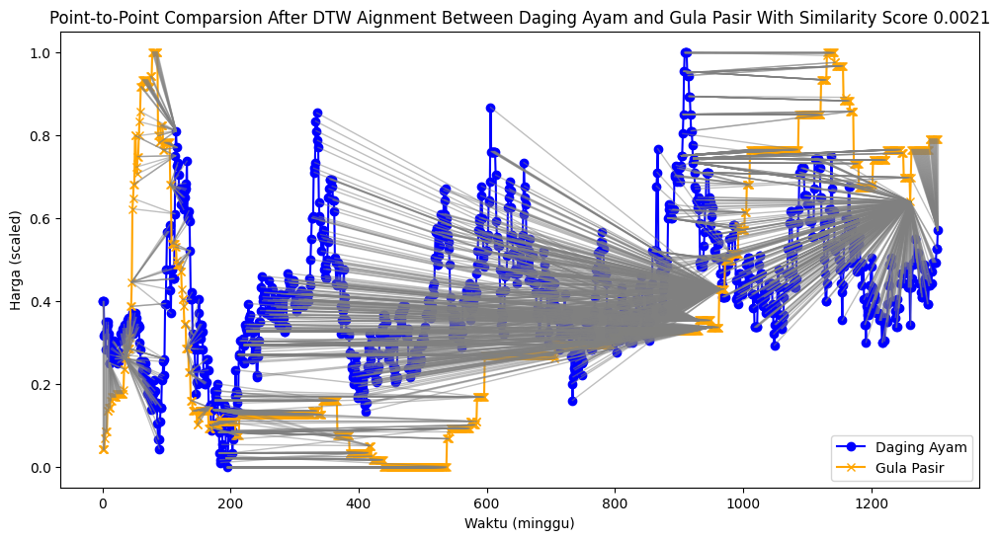

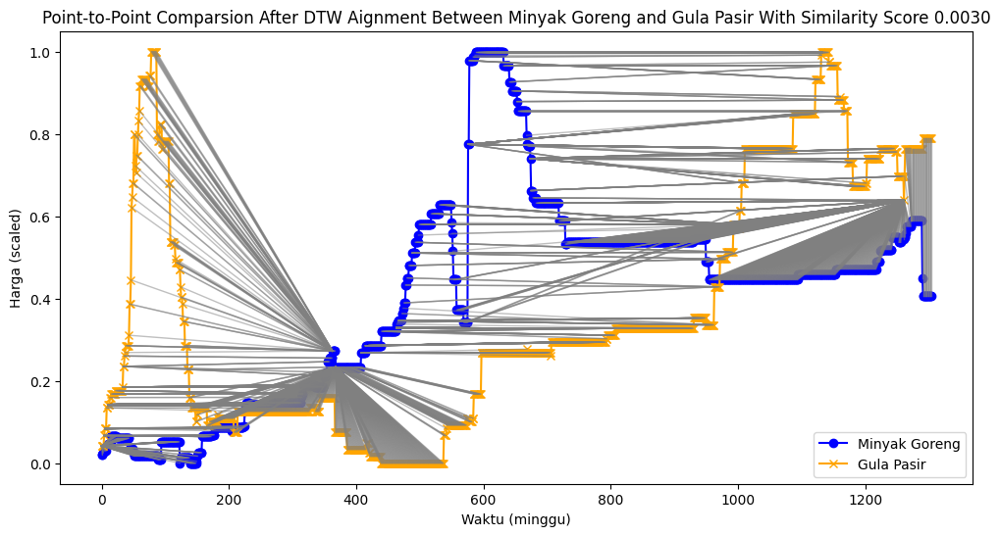

In [18]:
# Menghitung
%%time
# proses yang lama
import time
time.sleep(3)

data_antar_variabel = data_scaled.drop(['Tanggal'], axis=1)
# Membuat variabel list untuk menyimpan hasil kesamaan jarak
similarity_results = []

# Perulangan kombinasi untuk visualisasi dan menyimpan kesamaan jarak antar variabel
for i, j in combinations(drop_columns, 2):
    # kombinasi antar variabel
    series1 = data_antar_variabel[i].values
    series2 = data_antar_variabel[j].values

    # Pemodelan jarak antar variabel menggunakan DTW
    distance_antar_var, path_antar_var = dtw.warping_paths(series1, series2)
    best_path_antar_var = dtw.best_path(path_antar_var)
    similarity_score_antar_var = distance_antar_var / len(best_path_antar_var)

    # Menyimpan kesamaan jarak ke dalam dataframe
    similarity_results.append({
        'Variabel 1': i,
        'Variabel 2': j,
        'DTW Similarity Score': similarity_score_antar_var
    })

    df_similarity_score = pd.DataFrame(similarity_results)

    # Visualisasi DTW antar variabel
    plt.figure(figsize=(12,6))
    plt.plot(series1, label=i, color='blue', marker='o')
    plt.plot(series2, label=j, color='orange', marker='x')
    for a, b in best_path_antar_var:
        plt.plot([a,b], [series1[a], series2[b]], color='grey', linestyle='-', linewidth=1, alpha=0.5)
    plt.title(f"Point-to-Point Comparsion After DTW Aignment Between {i} and {j} With Similarity Score {similarity_score_antar_var:.4f}")
    plt.xlabel("Waktu (Hari)")
    plt.ylabel("Harga (scaled)")
    plt.legend()    

#### Visualisasi DTW antar variabel

In [19]:
# Memanggil dataset similarity score antar variabel
print(df_similarity_score)

NameError: name 'df_similarity_score' is not defined

#### DTW multivariabel
1. Modeling DTW multivariabel
2. Cek dimensi DTW multivariabel
3. Cek matriks DTW multivariabel
4. Visualisasi best path DTW multivariabel

### Multidimensional Scaling (MDS) (Opsional)

## Modeling FCM
1. Modeling FCM dengan MDS
2. Modeling FCM tanpa MDS

## Evaluasi FCM
Evaluasi menggunakan 3 best matriks dengan mempertimbangkan MPC, PC, PE, dan error.

In [ ]:
data_antar_variabel = data.drop(['Tanggal'], axis=1)
# Membuat variabel list untuk menyimpan hasil kesamaan jarak
similarity_results = []

# Perulangan kombinasi untuk visualisasi dan menyimpan kesamaan jarak antar variabel
for i, j in combinations(drop_columns, 2):
    # kombinasi antar variabel
    series1 = data_antar_variabel[i].values
    series2 = data_antar_variabel[j].values

    # Pemodelan jarak antar variabel menggunakan DTW
    distance_antar_var, path_antar_var = dtw.warping_paths(series1, series2)
    best_path_antar_var = dtw.best_path(path_antar_var)
    similarity_score_antar_var = distance_antar_var / len(best_path_antar_var)

    # Menyimpan kesamaan jarak ke dalam dataframe
    similarity_results.append({
        'Variabel 1': i,
        'Variabel 2': j,
        'DTW Similarity Score': similarity_score_antar_var
    })

    df_similarity_score = pd.DataFrame(similarity_results)

    # Visualisasi DTW antar variabel
    plt.figure(figsize=(12,6))
    plt.plot(series1, label=i, color='blue', marker='o')
    plt.plot(series2, label=j, color='orange', marker='x')
    for a, b in best_path_antar_var:
        plt.plot([a,b], [series1[a], series2[b]], color='grey', linestyle='-', linewidth=1, alpha=0.5)
    plt.title(f"Point-to-Point Comparsion After DTW Aignment Between {i} and {j} With Similarity Score {similarity_score_antar_var:.4f}")
    plt.xlabel("Waktu (Hari)")
    plt.ylabel("Harga (scaled)")
    plt.legend()    